<a href="https://colab.research.google.com/github/YonDraco/ftech_ai/blob/main/Final_RFM_segmentation_3T.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import library

In [1]:
!pip install pyod

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 147 kB 15.1 MB/s 
  Created wheel for pyod: filename=pyod-1.0.7-py3-none-any.whl size=181101 sha256=095cef87036c00f13b6a2dd0f613625ce70a79c54055b050b5c271021980b5b8
  Stored in directory: /root/.cache/pip/wheels/f7/e2/c1/1c7fd8b261e72411f6509afb429c84532e40ddcd96074473f4
Successfully built pyod


In [35]:
import numpy as np 
import pandas as pd 
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split

import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics \
import (confusion_matrix, precision_score,recall_score)
from sklearn.metrics import classification_report,accuracy_score

# Set visualization style
sns.set_style("darkgrid")

# EDA

#### Read dataframe

In [5]:
df_all = pd.read_csv("/content/drive/MyDrive/FTECHAI/df_all_91011.csv")
df_paid = pd.read_csv("/content/drive/MyDrive/FTECHAI/df_paid_91011.csv")

In [6]:
df_all.describe()

,recency,monetary,frequency,duration
count,758599.000000,758599.000000,758599.000000,758599.000000
mean,53.403610,15.106532,3.058708,35.882306
std,26.997991,759.046994,6.588949,42.104639
min,1.000000,0.000000,1.000000,0.044717
25%,33.000000,0.000000,1.000000,13.883216
50%,57.000000,0.000000,1.000000,24.423542
75%,78.000000,0.000000,3.000000,43.539609
max,91.000000,328450.000000,91.000000,3756.223764


In [7]:
df_all.median()

<ipython-input-7-13294d896614>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_all.median()


recency      57.000000
monetary      0.000000
frequency     1.000000
duration     24.423542
dtype: float64

In [8]:
df_all

,account_id,recency,monetary,frequency,duration
0,62a02cd3a3815feccbb7915a,15,0,3,5.237117
1,62a2e9d7a3815feccbb79179,3,0,1,30.814383
2,62a3a777a3815feccbb7917e,6,0,1,2.033133
3,62a69da1a3815feccbb79184,2,0,2,2.011192
4,62a6eb19a3815feccbb79188,6,0,2,8.838725
...,...,...,...,...,...
758594,638789c11505f828cf7babae,1,0,1,6.490567
758595,638789e31505f828cf7babaf,1,0,1,57.539951
758596,63878afb1505f828cf7babb0,1,0,1,19.862101
758597,63878bc01505f828cf7babb1,1,0,1,1.227600


In [9]:
df_paid.describe()

,recency,monetary,frequency,duration
count,5900.000000,5900.000000,5900.000000,5900.000000
mean,32.608305,1942.338983,31.470169,132.784245
std,29.378780,8387.366020,28.772084,91.932850
min,1.000000,100.000000,1.000000,0.514050
25%,2.000000,100.000000,7.000000,69.449773
50%,27.000000,250.000000,21.000000,110.557857
75%,59.000000,1250.000000,51.000000,170.866140
max,91.000000,328450.000000,91.000000,855.024608


In [10]:
df_paid

,account_id,recency,monetary,frequency,duration
0,62d80d181505f84bf054dbbe,17,200,19,13.722047
1,62d80d601505f84bf054dbd6,1,1150,62,30.638185
2,62d80df01505f84bf054dc0e,1,100,67,233.678068
3,62d80e3e1505f84bf054dc2b,80,500,12,127.646280
4,62d80e7f1505f84bf054dc4e,1,200,78,51.443886
...,...,...,...,...,...
5895,63869ca11505f828cf7ba07f,1,100,1,102.760166
5896,6386c5151505f828cf7ba193,1,100,1,27.815368
5897,6386c7a51505f828cf7ba1aa,1,100,1,73.044750
5898,6386ee331505f828cf7ba3cb,1,100,1,159.042616


In [11]:
dfa_dropid = df_all.drop(columns = 'account_id')
dfp_dropid = df_paid.drop(columns = 'account_id')

#### Draw

##### Heatmap

Text(0.5, 1.0, 'Heatmap')

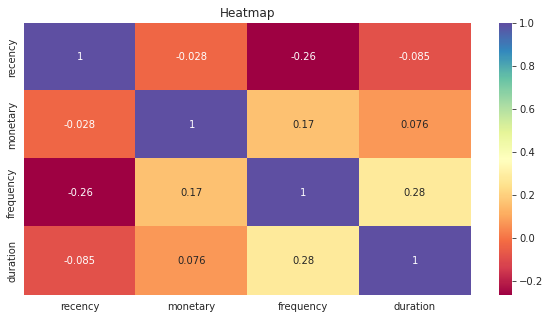

In [10]:
plt.figure(figsize=(10,5))
sns.heatmap(dfa_dropid.corr(), annot=True, cmap='Spectral')
plt.title("Heatmap")

Text(0.5, 1.0, 'Heatmap')

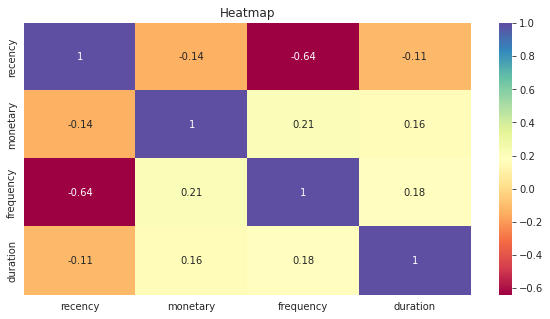

In [11]:
plt.figure(figsize=(10,5))
sns.heatmap(dfp_dropid.corr(), annot=True, cmap='Spectral')
plt.title("Heatmap")

##### Pairplot

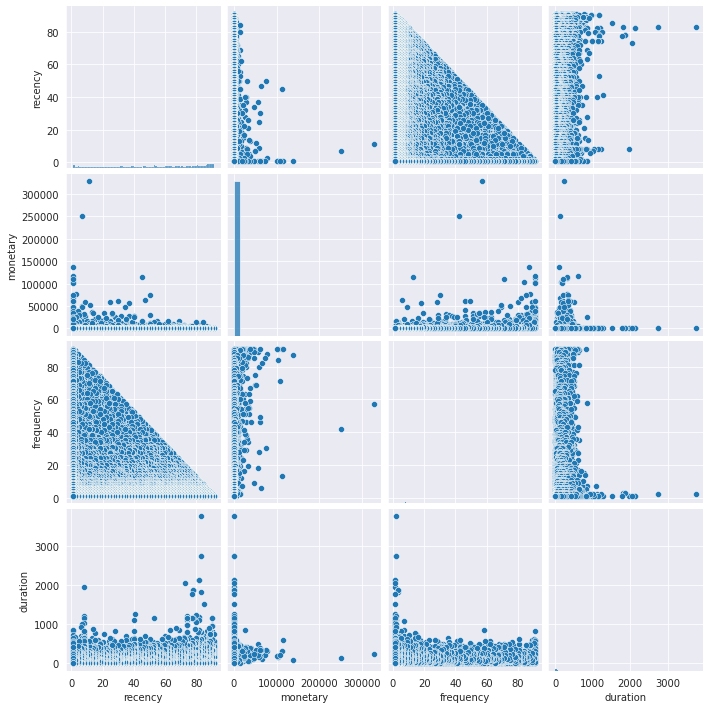

In [12]:
sns.pairplot(dfa_dropid, kind="scatter")
plt.show()

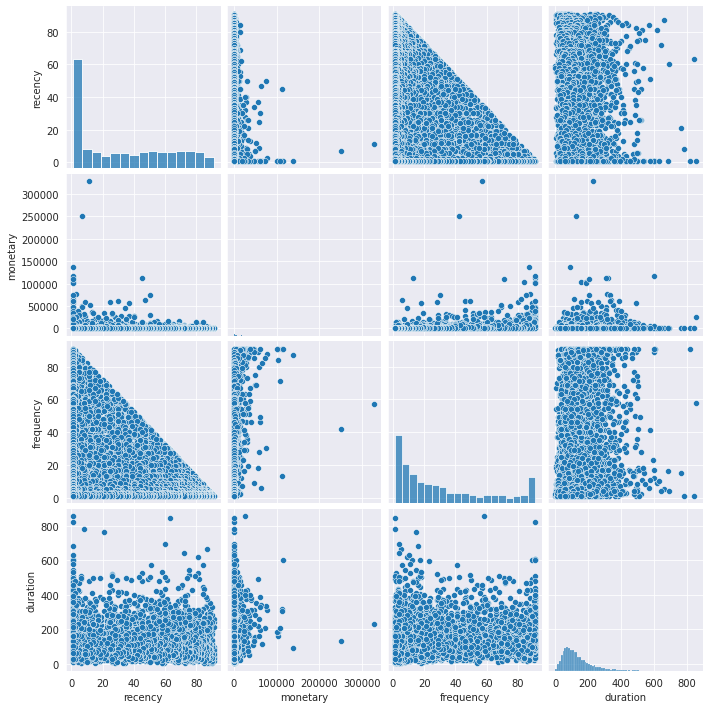

In [13]:
sns.pairplot(dfp_dropid, kind="scatter")
plt.show()

##### Distribution visualization

###### df_all

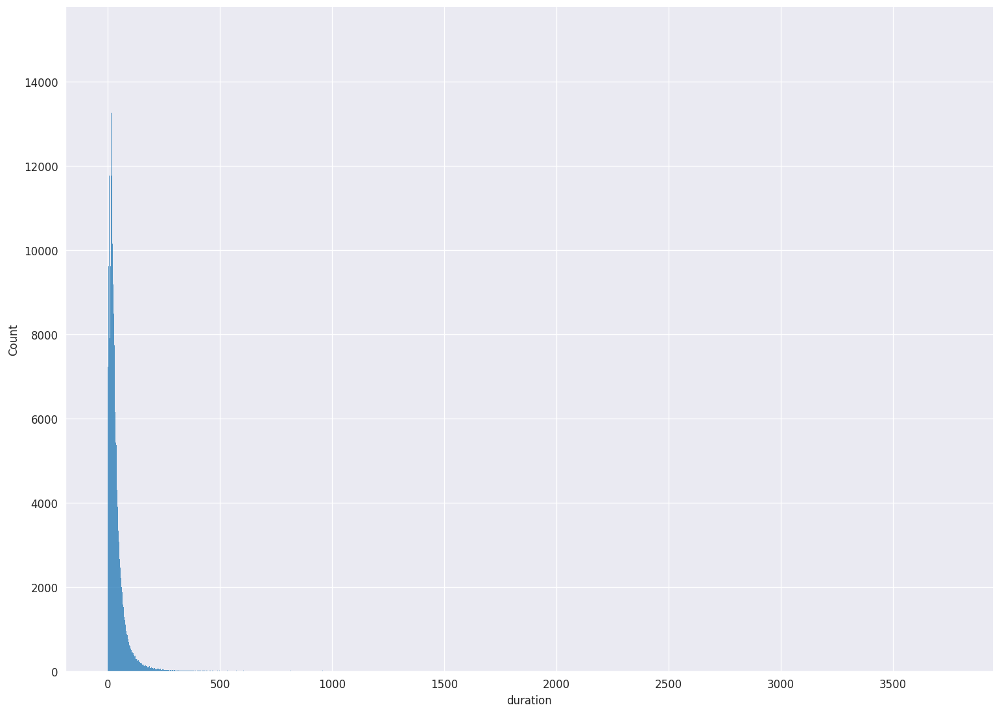

In [14]:
p = sns.displot(dfa_dropid['duration'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(120)

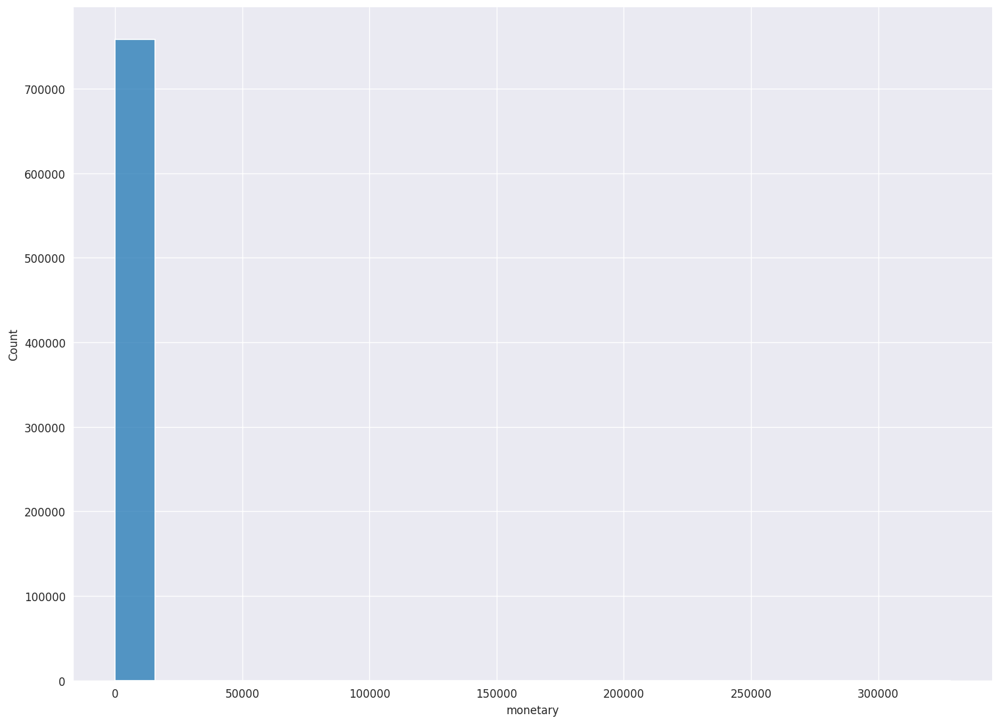

In [15]:
p = sns.displot(dfa_dropid['monetary'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(120)

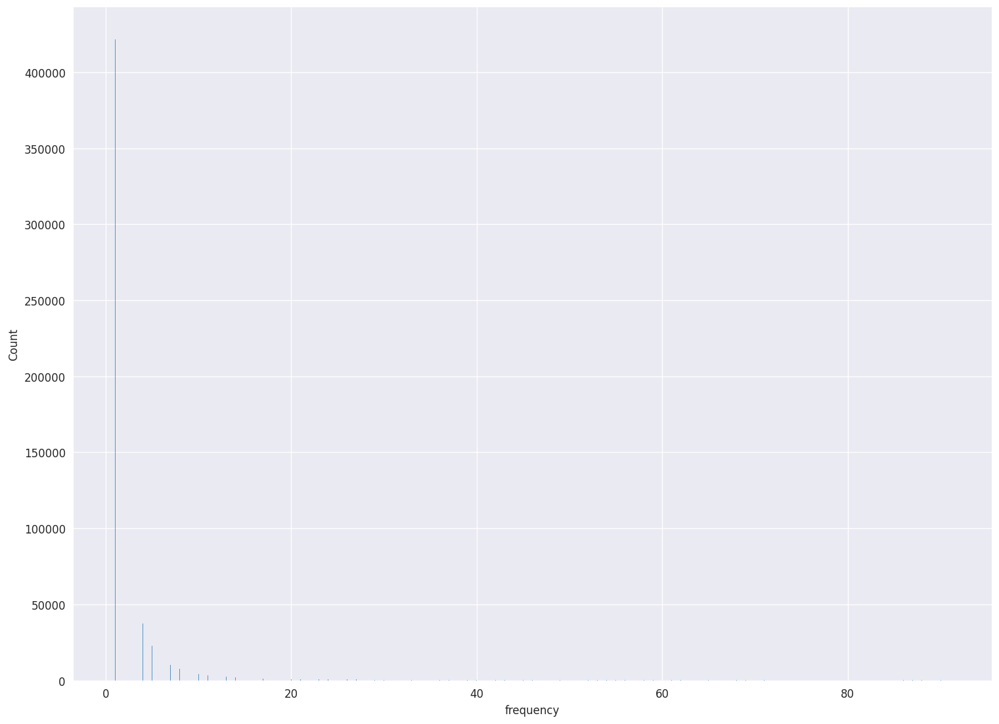

In [16]:
p = sns.displot(dfa_dropid['frequency'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(120)

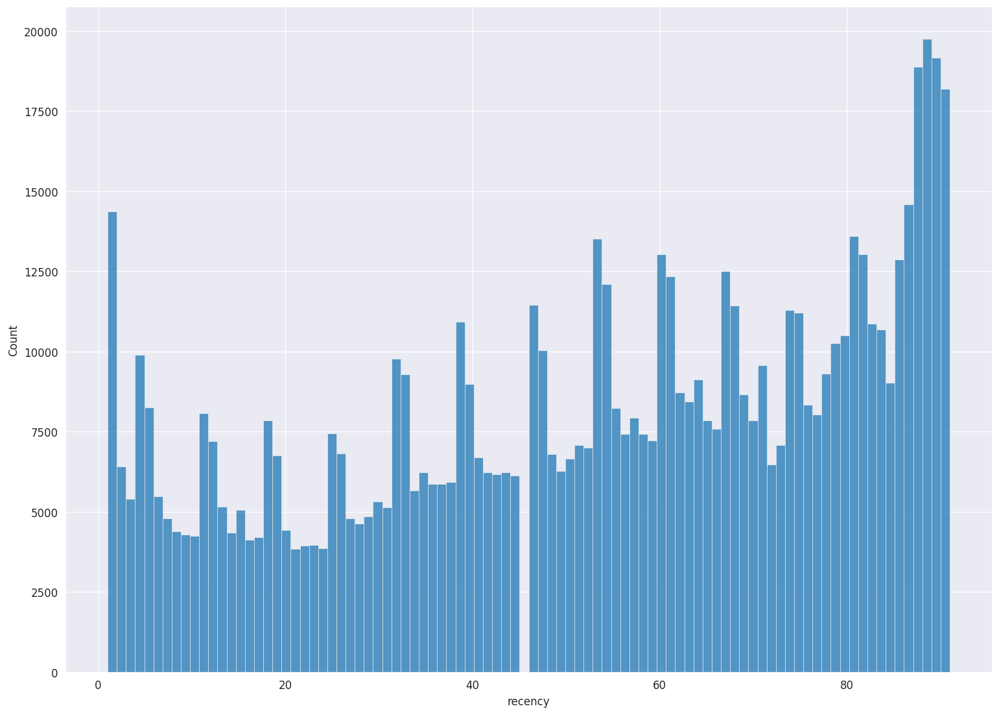

In [17]:
p = sns.displot(dfa_dropid['recency'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(120)

###### df_paid

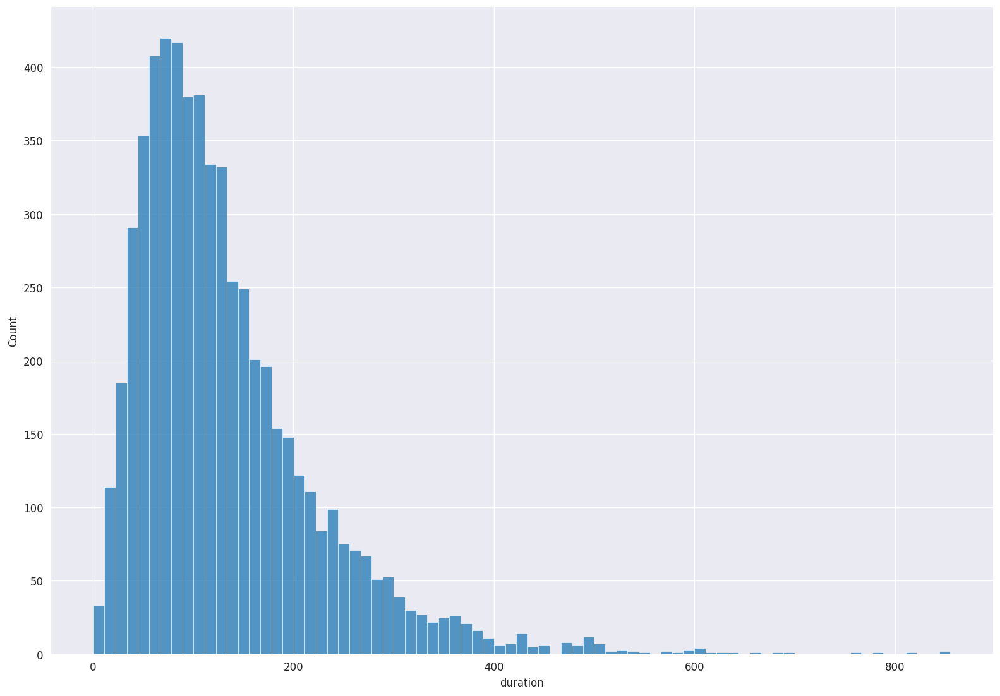

In [18]:
p = sns.displot(dfp_dropid['duration'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(120)

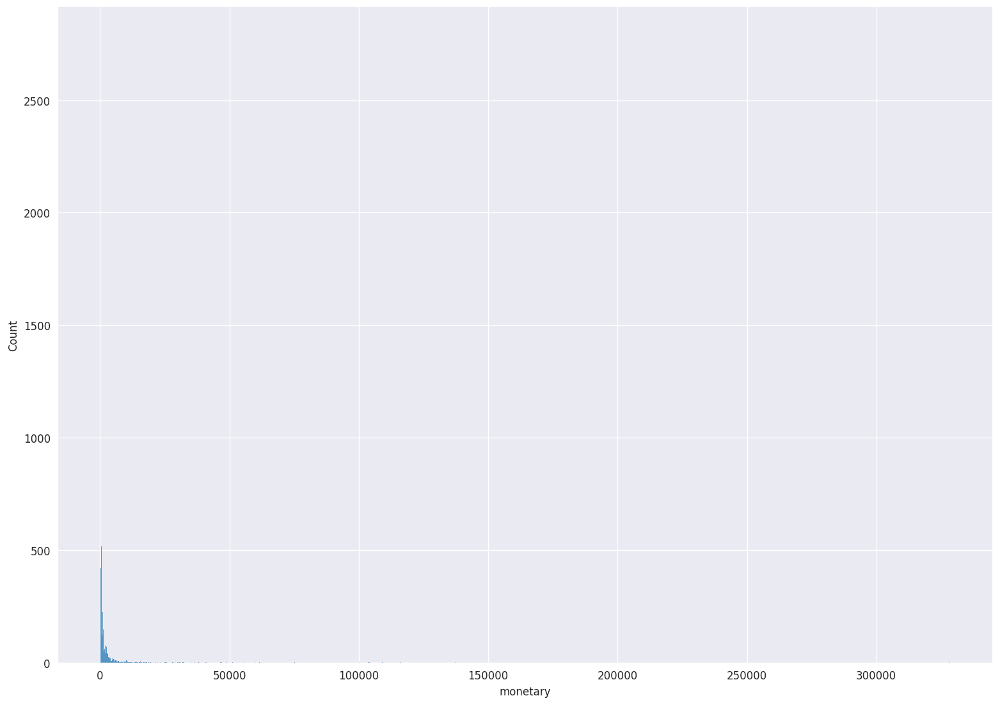

In [19]:
p = sns.displot(dfp_dropid['monetary'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(120)

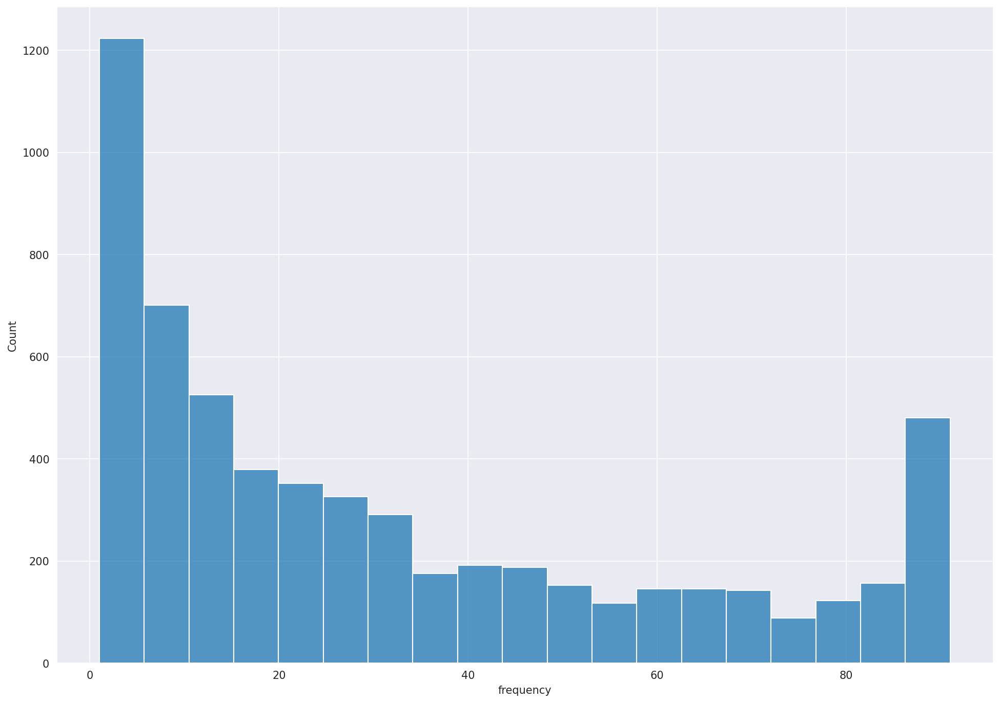

In [20]:
p = sns.displot(dfp_dropid['frequency'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(150)

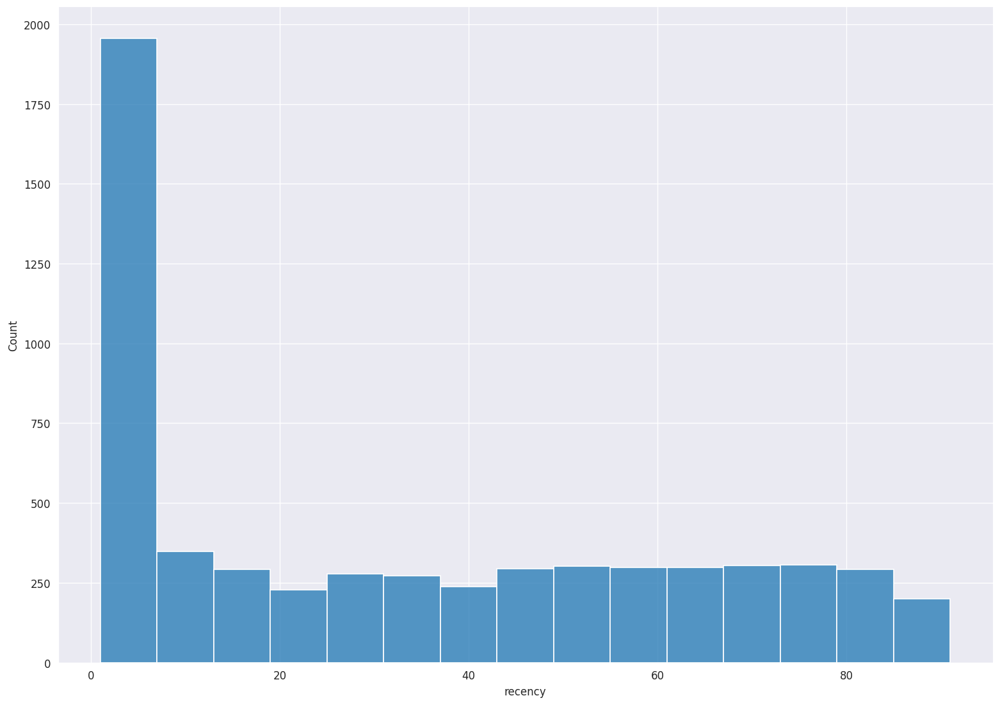

In [21]:
p = sns.displot(dfp_dropid['recency'])
p.fig.set_figwidth(15)
p.fig.set_figheight(10)
p.fig.set_dpi(120)

# Process noise

### Duration
Một session có thời gian chơi khoảng 2p nên các value duration <2 sẽ được coi là noise và tiến hành loại bỏ

In [12]:
# Get value with condition
dfa_dropid_rn = dfa_dropid[dfa_dropid.duration >2]
# dfp_dropid_rn = dfp_dropid[dfp_dropid.duration >2]

In [13]:
dfa_dropid_rn.describe()

,recency,monetary,frequency,duration
count,741531.000000,741531.000000,741531.000000,741531.000000
mean,53.337453,15.451074,3.103842,36.681455
std,27.019753,767.727967,6.655350,42.251812
min,1.000000,0.000000,1.000000,2.000017
25%,32.000000,0.000000,1.000000,14.633300
50%,57.000000,0.000000,1.000000,24.989283
75%,78.000000,0.000000,3.000000,44.240217
max,91.000000,328450.000000,91.000000,3756.223764


# Process outliers

## Method quan sát

### Duration

In [24]:
df_boxplot = pd.DataFrame(dfa_dropid_rn['duration'])
fig = px.box(df_boxplot)
fig.show()

### Monetary

In [25]:
df_boxplot = pd.DataFrame(df_paid['monetary'])
fig = px.box(df_boxplot)
fig.show()

## Method IQR

### Duration

In [26]:
Q1 = dfa_dropid_rn['duration'].quantile(0.25)
Q3 = dfa_dropid_rn['duration'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

In [27]:
outlier= dfa_dropid_rn[(dfa_dropid_rn['duration'] < lower) | (dfa_dropid_rn['duration'] > upper)]

In [29]:
outlier['duration'].describe()

count    54860.000000
mean       145.140702
std         81.778797
min         88.650870
25%        101.434631
50%        121.339475
75%        159.562594
max       3756.223764
Name: duration, dtype: float64

In [30]:
outlier['duration'].to_csv("3T_iqr_od.csv")

### Monetary

In [31]:
Q1 = df_paid['monetary'].quantile(0.25)
Q3 = df_paid['monetary'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

In [32]:
outlier= df_paid[(df_paid['monetary'] < lower) | (df_paid['monetary'] > upper)]

In [33]:
outlier['monetary'].describe()

count       715.000000
mean      12191.258741
std       21411.322820
min        3000.000000
25%        4000.000000
50%        6200.000000
75%       11300.000000
max      328450.000000
Name: monetary, dtype: float64

In [34]:
outlier['monetary'].to_csv("3T_iqr_om.csv")

## Method standard deviation, z-score

In [36]:
from scipy.stats import zscore

### Duration

In [37]:
scores = zscore(dfa_dropid_rn)
is_over_3 = np.abs(scores) > 3
outliers_d = dfa_dropid_rn[is_over_3]

In [38]:
outliers_d = pd.DataFrame(outliers_d)
outliers_d["duration"].describe()

count    12904.000000
mean       242.629808
std        121.203139
min        163.438763
25%        181.308593
50%        208.875290
75%        261.570742
max       3756.223764
Name: duration, dtype: float64

In [39]:
outliers_d['duration'].to_csv("3T_z_od.csv")

### Monetary

In [40]:
scores = zscore(dfp_dropid)
is_over_3 = np.abs(scores) > 3
outliers_m = df_paid[is_over_3]

In [41]:
outliers_m = pd.DataFrame(outliers_m)
outliers_m["monetary"].describe()

count        64.000000
mean      58796.093750
std       50065.080902
min       27950.000000
25%       32450.000000
50%       40550.000000
75%       61650.000000
max      328450.000000
Name: monetary, dtype: float64

In [42]:
outliers_m['monetary'].to_csv("3T_z_om.csv")

## Method: MAD
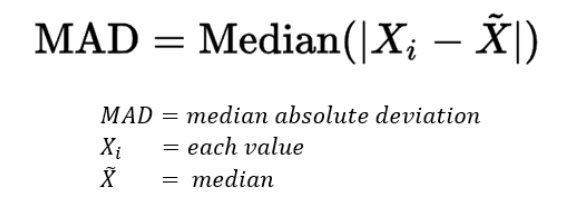

In [43]:
from scipy.stats import median_abs_deviation
from pyod.models.mad import MAD

In [44]:
df_mad_d = pd.read_csv("/content/drive/MyDrive/FTECHAI/3T/mad_duration.csv")
df_mad_m = pd.read_csv("/content/drive/MyDrive/FTECHAI/3T/mad_monetary.csv")

### Duration

In [61]:
df_mad_d = df_mad_d[df_mad_d.duration >2]

In [62]:
df_mad_d.describe()

,duration
count,741531.000000
mean,36.681455
std,42.251812
min,2.000017
25%,14.633300
50%,24.989283
75%,44.240217
max,3756.223764


In [63]:
mad_score = median_abs_deviation(df_mad_d['duration'])
mad_score
# có thể thay thế giá trị này thay cho std trong công thức z-score

13.24274922

In [64]:
mad = MAD(threshold=7.5)

df_mad_d_reshaped = df_mad_d.values.reshape(-1, 1)
labels = mad.fit_predict(df_mad_d_reshaped)

# Filter outliers
outliers = df_mad_d[labels == 1]

print(len(outliers))

11172


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function fit_predict is deprecated



In [65]:
outliers = pd.DataFrame(outliers)
outliers.describe()

,duration
count,11172.000000
mean,254.248790
std,126.336524
min,172.246341
25%,190.666664
50%,219.499870
75%,273.792327
max,3756.223764


In [66]:
outliers['duration'].to_csv("3T_mad_od.csv")

### Monetary

In [70]:
mad_score = median_abs_deviation(df_mad_m['monetary'])
mad_score

150.0

In [78]:
mad = MAD(threshold=100)

df_mad_m_reshaped = df_mad_m.values.reshape(-1, 1)
labels = mad.fit_predict(df_mad_m_reshaped)

# Filter outliers
outliers = df_mad_m[labels == 1]

print(len(outliers))

77


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function fit_predict is deprecated



In [79]:
outliers = pd.DataFrame(outliers)
outliers.describe()

,monetary
count,77.000000
mean,53099.350649
std,47327.467471
min,22700.000000
25%,29500.000000
50%,36300.000000
75%,57900.000000
max,328450.000000


In [80]:
outliers['monetary'].to_csv("3T_mad_om.csv")

## Method: [Robust covariance](https://towardsdatascience.com/robust-covariance-for-anomaly-detection-9c68b1ec4c4b)
Khoảng cách Mahalonobis 

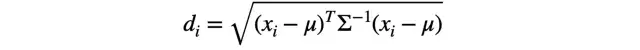


In [14]:
from sklearn.covariance import EllipticEnvelope

#### Duration

In [27]:
df_rc_d = dfa_dropid_rn

In [28]:
CONTAMINATION=.03

data = df_rc_d.values

X, y = data[:, :], data[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

rc = EllipticEnvelope(contamination=CONTAMINATION, random_state=0)
is_inlier = rc.fit_predict(X_train)    # +1 if inlier, -1 if outlier

mask = is_inlier != -1
X_train, y_train = X_train[mask, :], y_train[mask]

In [29]:
df_wo_outliers = pd.DataFrame(X_train, columns=df_rc_d.columns[:])                      

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



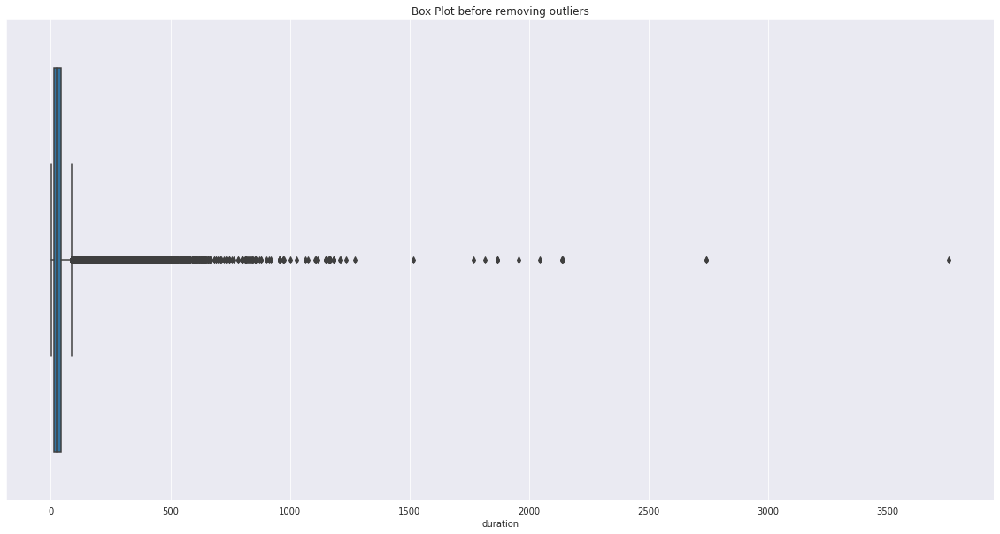

In [30]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_rc_d['duration']).set(title="Box Plot before removing outliers")
plt.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



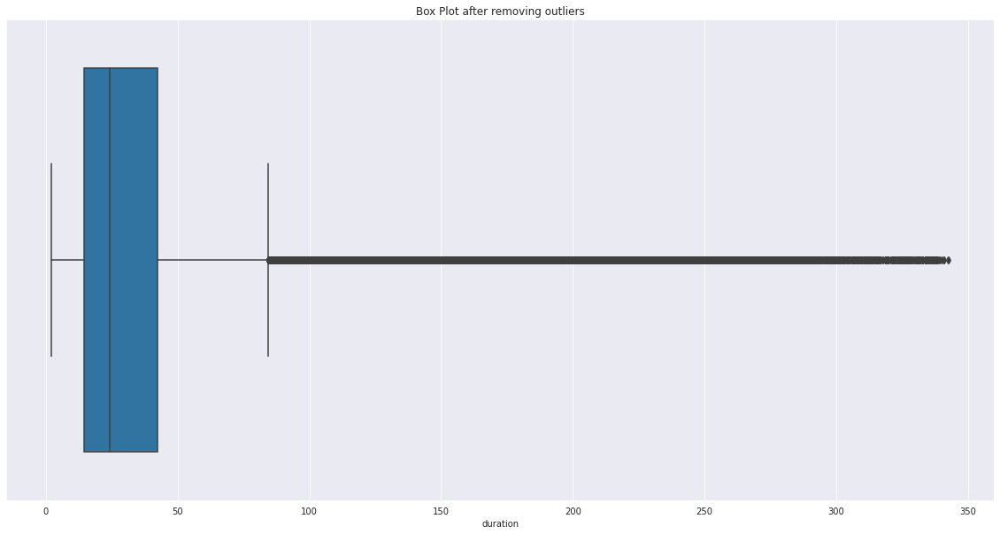

In [31]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_wo_outliers['duration']).set(title="Box Plot after removing outliers")
plt.show()

In [32]:
df_wo_outliers['duration'].describe()

count    575427.000000
mean         34.258292
std          33.933174
min           2.000033
25%          14.351594
50%          24.316222
75%          42.306302
max         342.893872
Name: duration, dtype: float64

In [33]:
max = df_wo_outliers['duration'].max()
df_all_od = df_rc_d[df_rc_d['duration'] > max]  
df_all_od['duration'].describe()

count    1275.000000
mean      493.224502
std       246.932944
min       342.960114
25%       371.975479
50%       419.510630
75%       510.822870
max      3756.223764
Name: duration, dtype: float64

In [34]:
df_all_od['duration'].to_csv("3T_rc_od.csv")

### Monetary

In [44]:
df_rc_m = dfp_dropid

In [46]:
CONTAMINATION=.03
data = df_rc_m.values

X, y = data[:, :], data[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

rc = EllipticEnvelope(contamination=CONTAMINATION, random_state=0)
is_inlier = rc.fit_predict(X_train)    # +1 if inlier, -1 if outlier

mask = is_inlier != -1
X_train, y_train = X_train[mask, :], y_train[mask]

In [48]:
df_wo_outliers = pd.DataFrame(X_train, columns=df_rc_m.columns[:])   

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



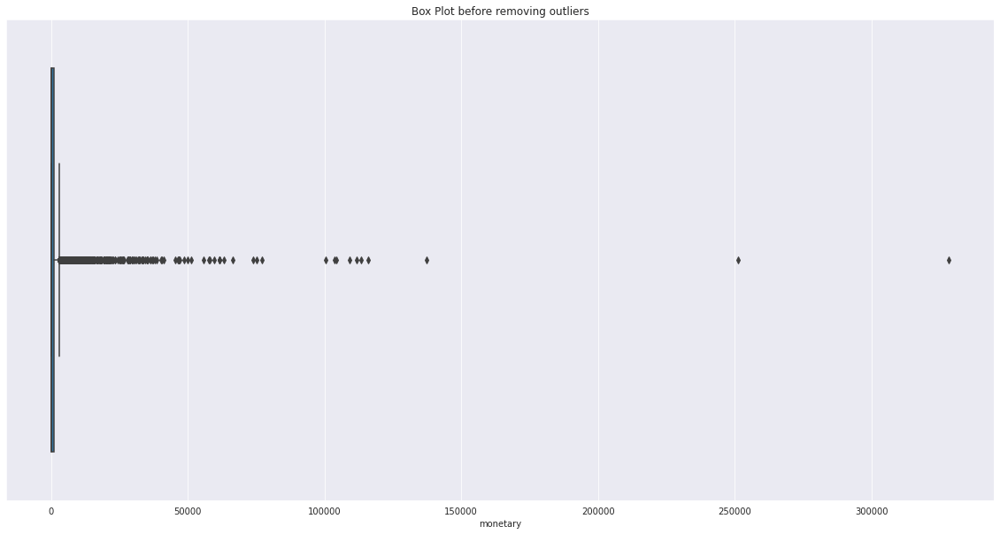

In [49]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_rc_m['monetary']).set(title="Box Plot before removing outliers")
plt.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



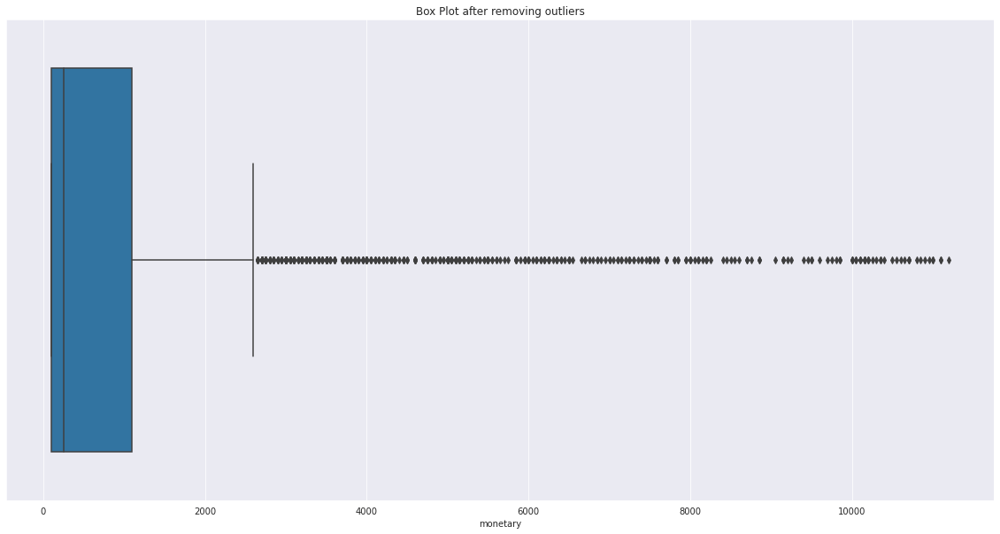

In [50]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_wo_outliers['monetary']).set(title="Box Plot after removing outliers")
plt.show()

In [53]:
max = df_wo_outliers['monetary'].max()
df_all_om = df_rc_m[df_rc_m['monetary'] > max]  
df_all_om['monetary'].describe()

count       181.000000
mean      31596.132597
std       35998.520594
min       11300.000000
25%       14350.000000
50%       20200.000000
75%       33450.000000
max      328450.000000
Name: monetary, dtype: float64

In [54]:
df_all_om['monetary'].to_csv("3T_rc_om.csv")

## Method IsolationForest

In [55]:
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split

### Duration

In [ ]:
dfa_dropid_rn.describe()

In [58]:
df = dfa_dropid_rn

In [59]:
CONTAMINATION=.03
#.1   
BOOTSTRAP = False   

data = df.values

# X, y = data[:, :-1], data[:, -1]
X, y = data[:, :], data[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

i_forest = IsolationForest(contamination=CONTAMINATION, bootstrap=BOOTSTRAP)
is_inlier = i_forest.fit_predict(X_train)    # +1 if inlier, -1 if outlier

mask = is_inlier != -1
X_train, y_train = X_train[mask, :], y_train[mask]

In [60]:
print(accuracy_score(mask,is_inlier))

0.9699995280029129


In [62]:
df_wo_outliers = pd.DataFrame(X_train, columns=df.columns[:])                      
df_boxplot = pd.DataFrame(data={'With outliers':df['duration'], 'Without outliers':df_wo_outliers['duration']})
fig = px.box(df_boxplot)
fig.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



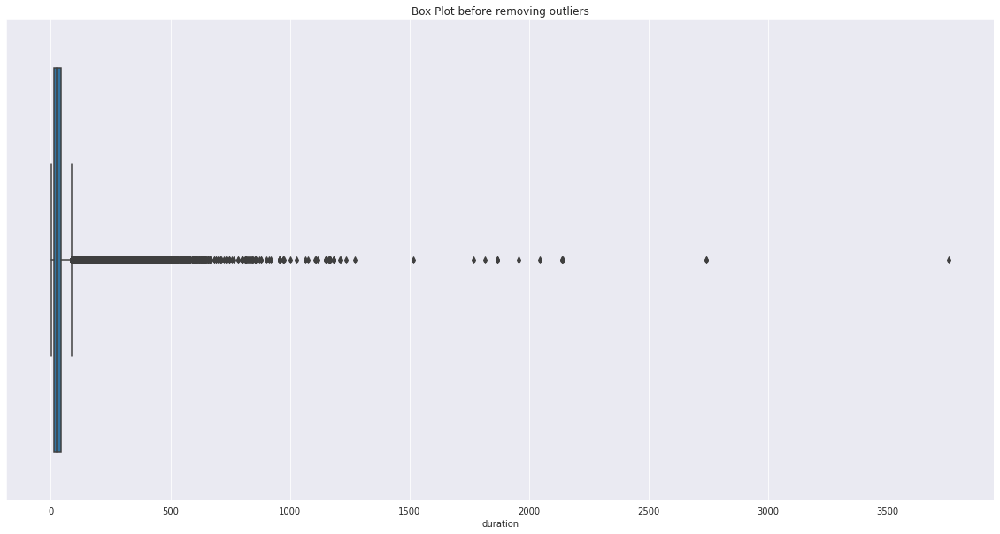

In [63]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df['duration']).set(title="Box Plot before removing outliers")
plt.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



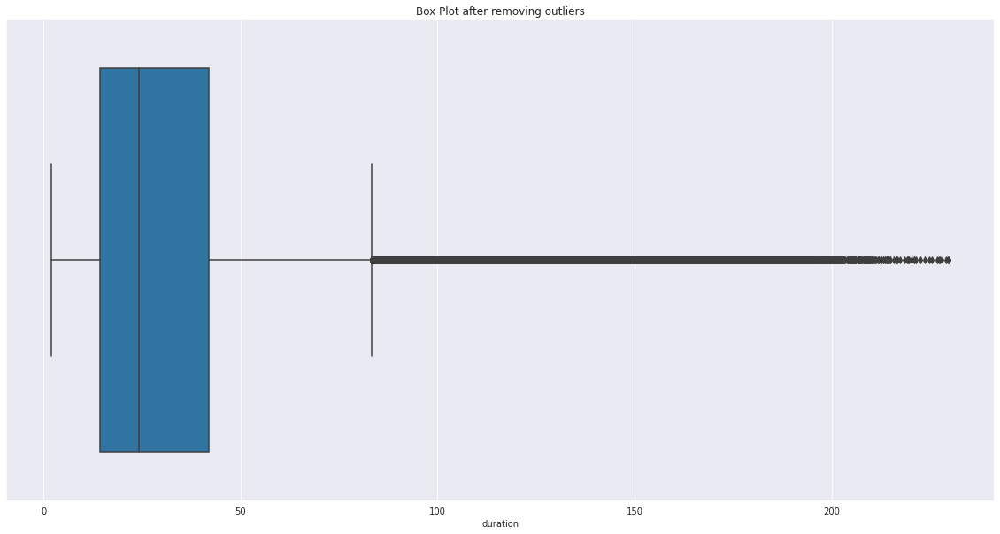

In [64]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_wo_outliers['duration']).set(title="Box Plot after removing outliers")
plt.show()

In [65]:
df_wo_outliers['duration'].describe()

count    575427.000000
mean         32.722623
std          28.673075
min           2.000033
25%          14.338996
50%          24.240592
75%          41.913129
max         229.823592
Name: duration, dtype: float64

In [66]:
max = df_wo_outliers['duration'].max()

In [67]:
# Get value with condition
df_all_od = df[df['duration'] > max]  
df_all_od['duration'].describe()

count    4817.000000
mean      330.892970
std       162.283887
min       229.842062
25%       251.960327
50%       286.508717
75%       349.135546
max      3756.223764
Name: duration, dtype: float64

In [68]:
df_all_od['duration'].to_csv("3T_iso_od.csv")

### Monetary

In [69]:
df  = dfp_dropid

In [70]:
CONTAMINATION=.03  
BOOTSTRAP = False   

data = df.values

# X, y = data[:, :-1], data[:, -1]
X, y = data[:, :], data[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

i_forest = IsolationForest(contamination=CONTAMINATION, bootstrap=BOOTSTRAP)
is_inlier = i_forest.fit_predict(X_train)    # +1 if inlier, -1 if outlier

mask = is_inlier != -1
X_train, y_train = X_train[mask, :], y_train[mask]

In [71]:
print(accuracy_score(mask,is_inlier))

0.9699152542372881


In [79]:
rng = np.random.RandomState(5)

In [72]:
df_wo_outliers=pd.DataFrame(X_train, columns=df.columns[:])                      
df_boxplot = pd.DataFrame(data={'With outliers':df['monetary'], 'Without outliers':df_wo_outliers['monetary']})
fig = px.box(df_boxplot)
fig.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



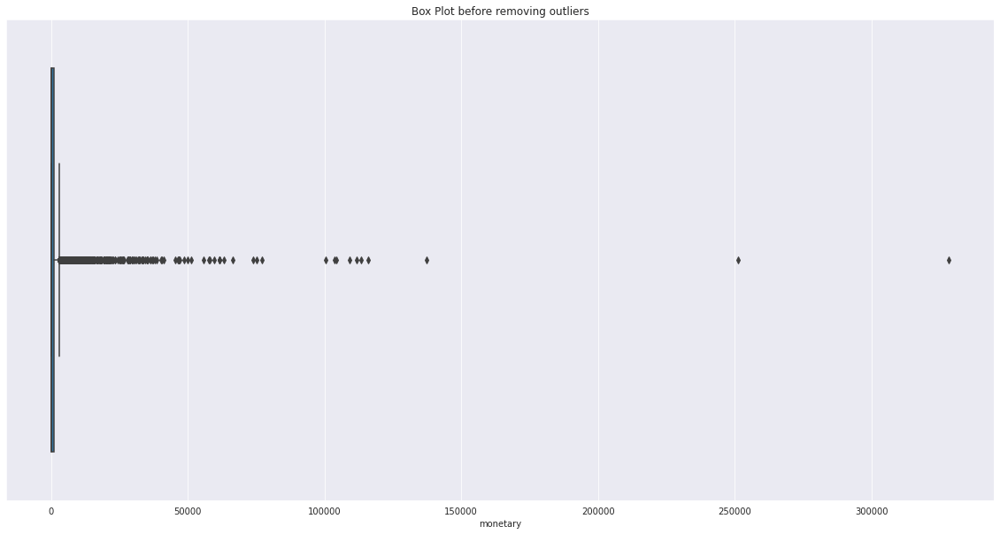

In [73]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df['monetary']).set(title="Box Plot before removing outliers")
plt.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



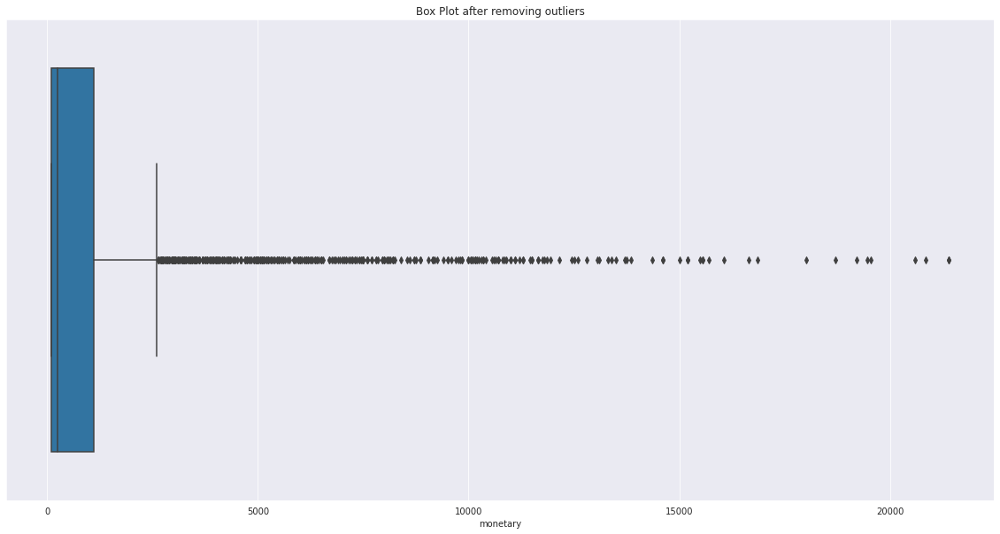

In [74]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_wo_outliers['monetary']).set(title="Box Plot after removing outliers")
plt.show()

In [75]:
df_wo_outliers['monetary'].describe()

count     4578.000000
mean      1111.882918
std       2186.930291
min        100.000000
25%        100.000000
50%        250.000000
75%       1100.000000
max      21400.000000
Name: monetary, dtype: float64

In [76]:
max = df_wo_outliers['monetary'].max()

In [77]:
# Get value with condition
df_paid_om = df[df['monetary'] > max]  
df_paid_om['monetary'].describe()

count        81.000000
mean      51563.580247
std       46624.776817
min       21550.000000
25%       28550.000000
50%       35200.000000
75%       57750.000000
max      328450.000000
Name: monetary, dtype: float64

In [78]:
df_paid_om['monetary'].to_csv("3T_iso_om.csv")

## Method One class SVM

In [84]:
from sklearn.svm import OneClassSVM
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.pyplot import figure

In [85]:
from numpy import quantile, random, where

### Duration

In [86]:
df = dfa_dropid_rn

In [87]:
data = df.values

X, y = data[:, :], data[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
model_ocs = OneClassSVM(nu=0.03, kernel="rbf", gamma='scale')
is_inlier = model_ocs.fit_predict(X_train)    # +1 if inlier, -1 if outlier

mask = is_inlier != -1
X_train, y_train = X_train[mask, :], y_train[mask]
#45p

In [88]:
print(accuracy_score(mask,is_inlier))

0.9700012137067954


In [ ]:
df_wo_outliers=pd.DataFrame(X_train, columns=df.columns[:])                      
df_boxplot = pd.DataFrame(data={'With outliers':df['duration'], 'Without outliers':df_wo_outliers['duration']})
fig = px.box(df_boxplot)
fig.show()

In [ ]:
# plt.scatter(df["duration"], , c='#9467bd')

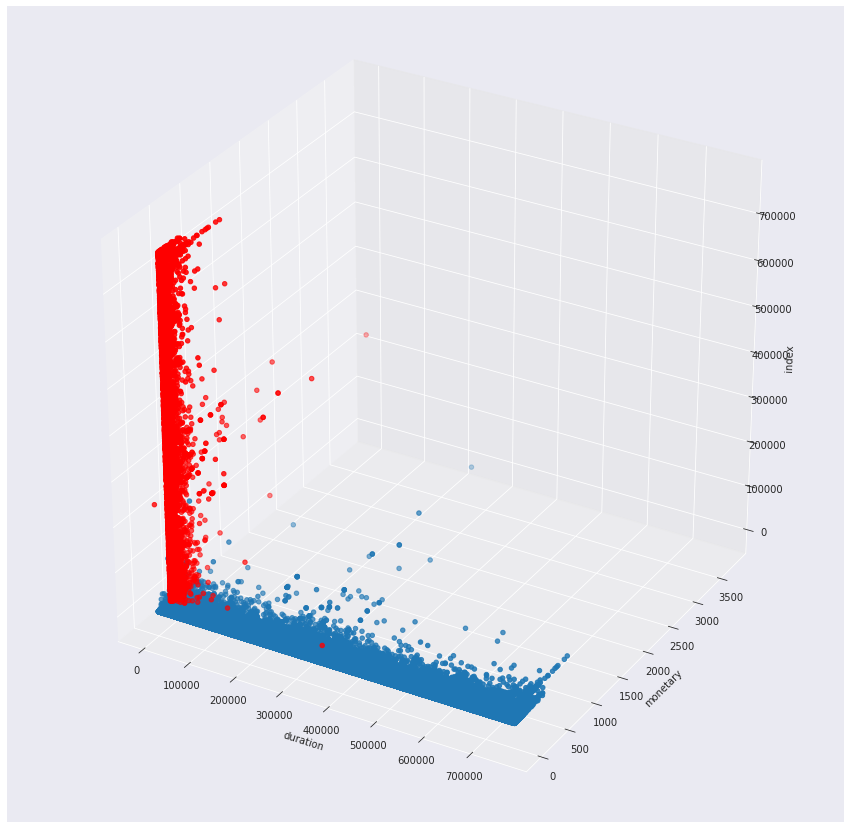

In [113]:
threedee = plt.figure(figsize=(15,15)).gca(projection='3d')
threedee.scatter(df.index, df['duration'], df['monetary'])
threedee.scatter(df_od["monetary"], df_od["duration"], df_od.index, c = "r")
threedee.set_xlabel('duration')
threedee.set_ylabel('monetary')
threedee.set_zlabel('index')
plt.show()

In [ ]:
# plt.scatter(df_wo_outliers["duration"], df_wo_outliers["monetary"])
# plt.scatter(df_od["duration"], df_od["monetary"], c = "r")

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



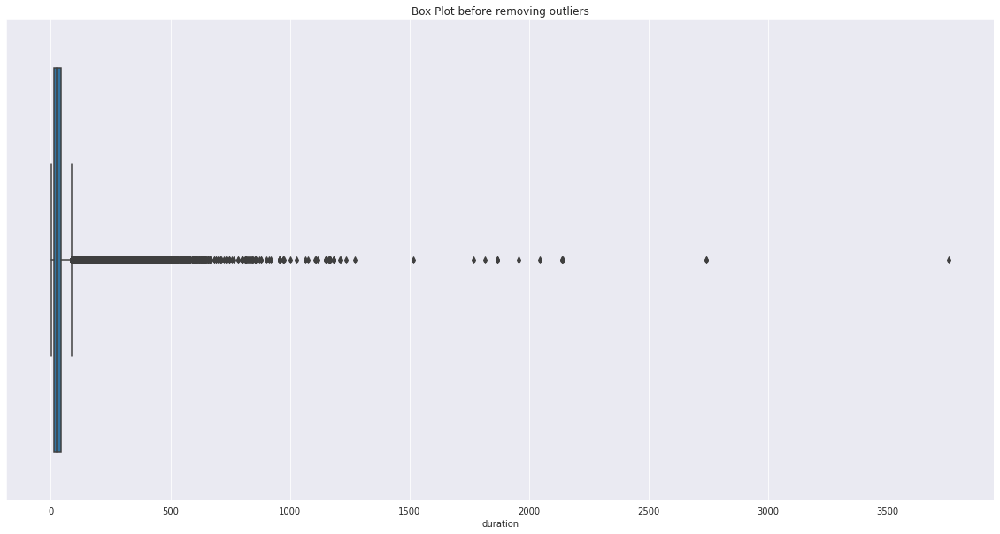

In [116]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df['duration']).set(title="Box Plot before removing outliers")
plt.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



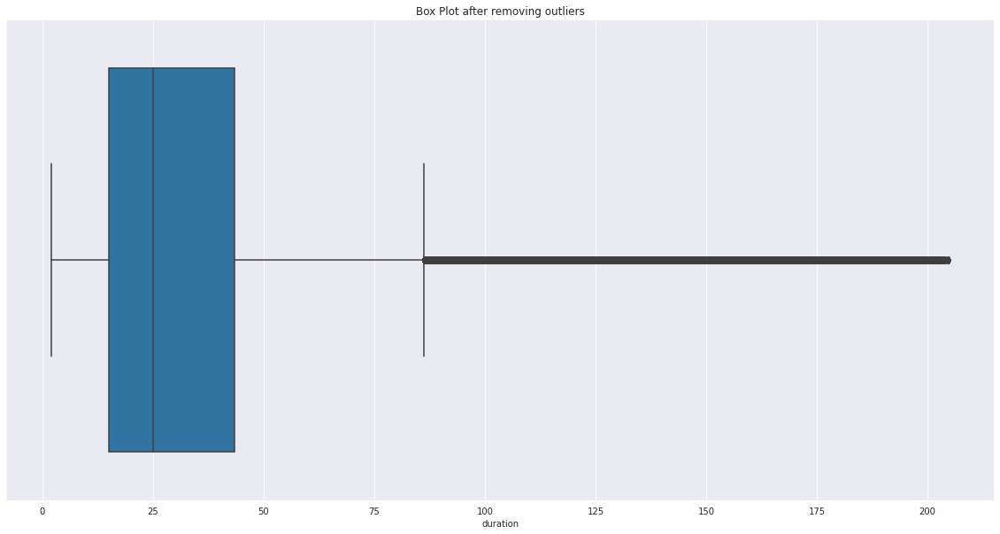

In [115]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_wo_outliers['duration']).set(title="Box Plot after removing outliers")
plt.show()

In [101]:
df_wo_outliers['duration'].describe()

count    575428.000000
mean         34.315330
std          30.325987
min           2.000033
25%          14.988512
50%          24.997575
75%          43.490299
max         204.895308
Name: duration, dtype: float64

In [103]:
max = df_wo_outliers['duration'].max()
min = df_wo_outliers['duration'].min()

In [104]:
df_od = df[(df['duration'] > max) | (df['duration'] < min)]

In [106]:
df_od['duration'].describe()

count    6825.000000
mean      297.239871
std       146.034059
min         2.000017
25%       225.573101
50%       256.844339
75%       315.713230
max      3756.223764
Name: duration, dtype: float64

In [107]:
df_od['duration'].to_csv("3T_ocs_od.csv")

### Monetary

In [117]:
df = dfp_dropid

In [118]:
data = df.values

X, y = data[:, :], data[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
model_ocs = OneClassSVM(nu=0.03, kernel="rbf", gamma='scale')
is_inlier = model_ocs.fit_predict(X_train)    # +1 if inlier, -1 if outlier

mask = is_inlier != -1
X_train, y_train = X_train[mask, :], y_train[mask]

In [121]:
print(accuracy_score(mask,is_inlier))

0.9694915254237289


In [119]:
df_wo_outliers=pd.DataFrame(X_train, columns=df.columns[:])                      
df_boxplot = pd.DataFrame(data={'With outliers':df['monetary'], 'Without outliers':df_wo_outliers['monetary']})
fig = px.box(df_boxplot)
fig.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



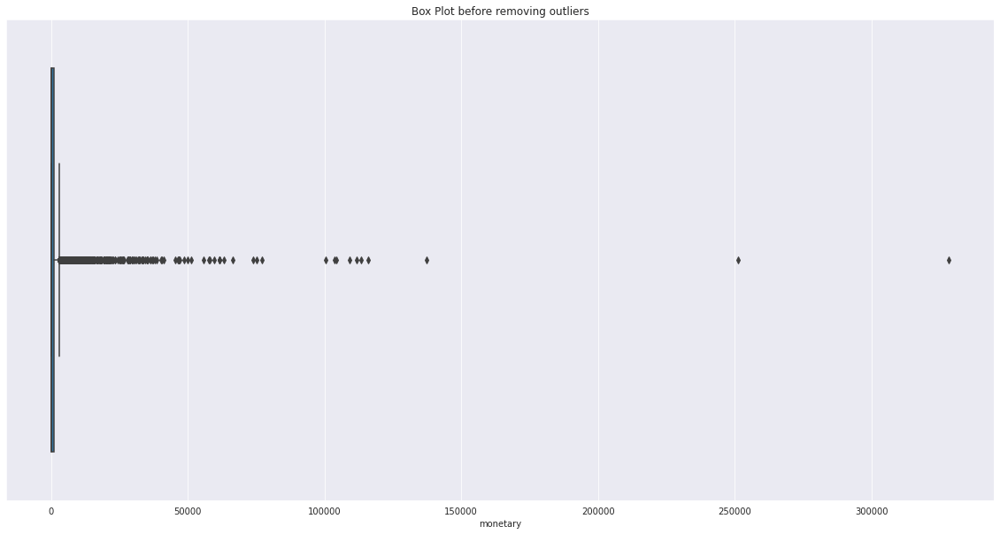

In [122]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df['monetary']).set(title="Box Plot before removing outliers")
plt.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



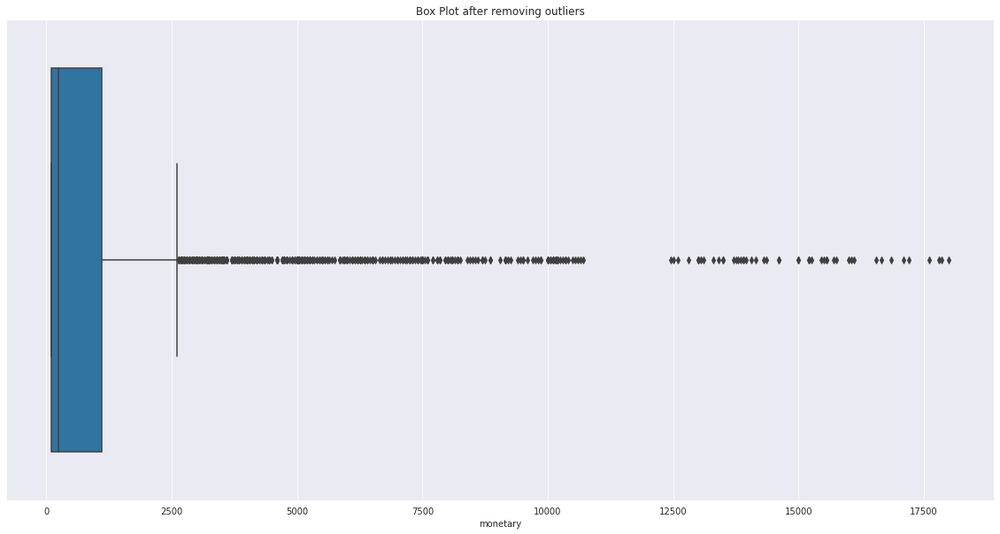

In [123]:
fig, ax = plt.subplots(figsize=(20, 10))
 
sns.boxplot(df_wo_outliers['monetary']).set(title="Box Plot after removing outliers")
plt.show()

In [124]:
df_wo_outliers['monetary'].describe()

count     4576.000000
mean      1132.375437
std       2192.784794
min        100.000000
25%        100.000000
50%        250.000000
75%       1100.000000
max      18000.000000
Name: monetary, dtype: float64

In [125]:
max = df_wo_outliers['monetary'].max()

In [126]:
# Get value with condition
df_paid_om = df[df['monetary'] > max]  
df_paid_om['monetary'].describe()

count       105.000000
mean      44304.761905
std       43035.042476
min       18050.000000
25%       22100.000000
50%       30700.000000
75%       46850.000000
max      328450.000000
Name: monetary, dtype: float64

In [127]:
df_paid_om['monetary'].to_csv("3T_ocs_om.csv")

## Method KNN

In [128]:
from pyod.models.knn import KNN
from sklearn.linear_model import LinearRegression

### Duration

In [129]:
dfa_dropid_rn.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 741531 entries, 0 to 758598
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   recency    741531 non-null  int64  
 1   monetary   741531 non-null  int64  
 2   frequency  741531 non-null  int64  
 3   duration   741531 non-null  float64
dtypes: float64(1), int64(3)
memory usage: 44.4 MB


In [130]:
df = dfa_dropid_rn

In [137]:
knn = KNN(contamination=0.005, n_neighbors=20, n_jobs=-1)
knn.fit(df)

is_outlier = knn.labels_ == 1

outliers = df[is_outlier]

print(len(outliers))

3708


In [138]:
outliers.describe()

,recency,monetary,frequency,duration
count,3708.000000,3708.000000,3708.000000,3708.000000
mean,25.621359,3010.504315,40.754045,201.658925
std,27.777539,10434.128528,30.090914,215.925325
min,1.000000,0.000000,1.000000,2.081042
25%,1.000000,300.000000,14.000000,88.588217
50%,13.000000,800.000000,34.000000,145.315708
75%,47.000000,2200.000000,67.000000,237.139080
max,91.000000,328450.000000,91.000000,3756.223764


In [139]:
outliers.to_csv("3T_knn_od.csv")

### Monetary

In [142]:
df = dfp_dropid

In [150]:
knn = KNN(contamination=0.009, n_neighbors=20, n_jobs=-1)
knn.fit(df)

is_outlier = knn.labels_ == 1

outliers = df[is_outlier]

print(len(outliers))

54


In [151]:
outliers.describe()

,recency,monetary,frequency,duration
count,54.000000,54.000000,54.000000,54.000000
mean,9.814815,63665.740741,67.074074,251.769235
std,13.974470,53173.768913,25.517180,141.737228
min,1.000000,25000.000000,6.000000,51.401334
25%,1.000000,35275.000000,52.000000,160.094368
50%,1.000000,46750.000000,77.500000,223.224247
75%,12.750000,65725.000000,89.000000,316.356024
max,50.000000,328450.000000,91.000000,855.024608


In [152]:
outliers.to_csv("3T_knn_om.csv")

## Method LOF

### Duration

In [162]:
from pyod.models.lof import LOF

In [163]:
df = dfa_dropid_rn

In [164]:
lof = LOF(contamination=0.05, n_neighbors=20, n_jobs=-1)
lof.fit(df)

is_outlier = lof.labels_ == 1

outliers = df[is_outlier]

print(len(outliers))

37077


In [165]:
outliers.describe()

,recency,monetary,frequency,duration
count,37077.000000,37077.000000,37077.000000,37077.000000
mean,68.754349,40.684252,1.090676,16.218747
std,20.838299,2710.552816,1.801939,47.739605
min,1.000000,0.000000,1.000000,2.001400
25%,57.000000,0.000000,1.000000,6.936467
50%,75.000000,0.000000,1.000000,14.398666
75%,86.000000,0.000000,1.000000,20.536516
max,91.000000,328450.000000,91.000000,3756.223764


In [166]:
outliers.to_csv("3T_lof_od.csv")

### Monetary

In [167]:
df = dfp_dropid

In [168]:
lof = LOF(contamination=0.009, n_neighbors=20, n_jobs=-1)
lof.fit(df)

is_outlier = lof.labels_ == 1

outliers = df[is_outlier]

print(len(outliers))

54


In [169]:
outliers.describe()

,recency,monetary,frequency,duration
count,54.000000,54.000000,54.000000,54.000000
mean,34.203704,32538.888889,35.166667,400.558509
std,33.852276,66226.204460,33.740827,244.638591
min,1.000000,100.000000,1.000000,3.600485
25%,1.000000,512.500000,10.250000,163.916569
50%,27.500000,1025.000000,16.500000,488.396660
75%,71.750000,5187.500000,67.500000,598.830865
max,87.000000,328450.000000,91.000000,846.511291


In [170]:
outliers.to_csv("3T_lof_om.csv")

# Process missing data

+ Bỏ qua
+ Xử lý tay (không tự động, bán tự động)
+ Dùng giá trị thay thế (tự động): hằng số toàn cục, trị phổ biến nhất,
trung bình toàn cục, trung bình cục bộ, trị dự đoán, …
+ Ngăn chặn dữ liệu bị thiếu: thiết kế tốt CSDL và các thủ tục nhập
liệu (các ràng buộc dữ liệu)